### Importing Data
Movie data was obtained from Kaggle's TMDB dataset (https://www.kaggle.com/tmdb/tmdb-movie-metadata). The data was cleaned with the `cleaned_data.py` script. The `import_clean_csv` method from the `import_data.py` module is used to import the cleaned TMDB data

In [2]:
import os
import importlib.util
import pandas as pd
import numpy as np
import sys
from scipy import stats

In [3]:
%load_ext autoreload
%autoreload 2

current_file_path = os.path.abspath(os.path.join("__file__" ,"../.."))
tools_path = os.path.abspath(os.path.join(current_file_path, 'src', 'tools'))
sys.path.append(os.path.abspath(os.path.join(tools_path)))
import thinkstats2, thinkplot
from data_vis import get_plotly

import_data_path = os.path.join(current_file_path,'src','data')

spec = importlib.util.spec_from_file_location("import_clean_csv", os.path.join(import_data_path,"import_clean_data.py"))
import_data = importlib.util.module_from_spec(spec)
spec.loader.exec_module(import_data)

data = import_data.import_clean_csv()

### Importing Packages for Visualizations

In [4]:
#Following Python packages are necessary for data visualiations below

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objs as go
import cufflinks as cf

init_notebook_mode(connected=True)
cf.go_offline()

In [5]:
#bootstrap helper function
def draw_bs_reps(data, func, size=1):
    if len(data) == 1:
        x = data[0]
    else:
        x, y = data
    inds = np.arange(len(x))
    bs_reps = np.empty(size)
    
    for i in range(size):
        bs_inds = np.random.choice(inds, size=len(inds))
        bs_x = x.iloc[bs_inds]
        if len(data) > 1:
            bs_y = y.iloc[bs_inds]
            bs_reps[i] = func(bs_x, bs_y)[0] if len(func(bs_x, bs_y)) > 1 else func(bs_x, bs_y)
        else:
            bs_reps[i] = func(bs_x)
    
    return bs_reps

#helper function to compare hits and flops data
def plot_bs_comp(df, col, func, size, bins, split=True):
    if split:
        if isinstance(col, list):
            hits = draw_bs_reps([df[df.net > 0][col[0]],df[df.net > 0][col[1]]], func=func, size=size)
            flops = draw_bs_reps([df[df.net <= 0][col[0]],df[df.net <= 0][col[1]]], func=func, size=size)
        else:
            hits = draw_bs_reps([df[df.net > 0][col]], func=func, size=size)
            flops = draw_bs_reps([df[df.net <= 0][col]], func=func, size=size)
        
        print("95% CI for hits: ", np.percentile(hits, [2.5, 97.5]))
        print("95% CI for flops: ", np.percentile(flops, [2.5, 97.5]))

        _ = plt.hist(hits, normed=True, bins=bins, label="Hits")
        _ = plt.hist(flops, normed=True, bins=bins, label="Flops")
        _ = plt.xlabel(col)
        _ = plt.title('Distribution of ' + col)
    else:
        if isinstance(col, list):
            total = draw_bs_reps([df[col[0]],df[col[1]]], func=func, size=size)
        else:
            total = draw_bs_reps([df[col]], func=func, size=size)
        
        print("95% CI: ", np.percentile(total, [2.5, 97.5]))
        _ = plt.hist(total, normed=True, bins=bins, label="total")

        
    
    plt.legend()

In [6]:
# create dataframes from cleaned data
movies = data['tmdb_movie_main'].set_index(['movie_id', 'title'])
movies['release_date'] = pd.to_datetime(movies['release_date'])
cast = data['tmdb_cast_credit'].set_index(['movie_id', 'title'])
crew = data['tmdb_crew_credit'].set_index(['movie_id', 'title'])
genres = data['tmdb_movie_genres'].set_index(['movie_id', 'title'])
keywords = data['tmdb_movie_keywords'].set_index(['movie_id', 'title'])
prod_company = data['tmdb_movie_production_companies'].set_index(['movie_id', 'title'])
prod_countries = data['tmdb_movie_production_countries'].set_index(['movie_id', 'title'])
languages = data['tmdb_movie_spoken_languages'].set_index(['movie_id', 'title'])

In [7]:
movies['net'] = movies.revenue - movies.budget
movies['net_pct'] = movies.revenue.divide(movies.budget) - 1

key_metrics = ['budget', 'revenue','net', 'net_pct','runtime', 'vote_average', 'vote_count','popularity', 'release_date']
Total = movies[key_metrics]
Hits = Total[Total.net >= 0]
Flops = Total[Total.net < 0]

Total.name = "Total"
Hits.name = "Hits"
Flops.name = "Fops"

In [8]:
Total_genres = Total.merge(right=genres, left_index=True, right_index=True)
Total_genre_count = Total_genres.reset_index().groupby('title')['name'].agg(['count'])
Total_with_genre_count = Total.merge(right=Total_genre_count, left_index=True, right_index=True)
Total_with_genre_count.rename(columns={'count':'genre_count'},inplace=True)

# Genres
A movie with a high number of genres may often be considered too complex to properly market to audiences. Movies typically have between two and three genres associated with them. The data, however, shows us that audiences may prefer movies with more genres associated to them, but not too much more. After investigating the correlation between net revenue and genre count, we can see a fairly weak, but positive correlation.

95% CI:  [ 2.5449322   2.61573776]


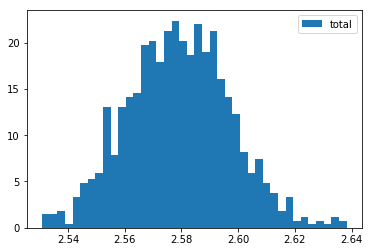

In [9]:
plot_bs_comp(Total_with_genre_count, 'genre_count', np.mean, size=1000, bins=40, split=False)

95% CI for hits:  [ 2.57230559  2.65418656]
95% CI for flops:  [ 2.45031712  2.56589147]


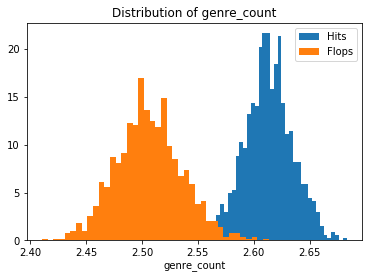

In [10]:
plot_bs_comp(Total_with_genre_count, 'genre_count', np.mean, size=1000, bins=40)

There is a weak uphill relationship between the number of genres and net revenue

95% CI:  [ 0.10845317  0.15929015]


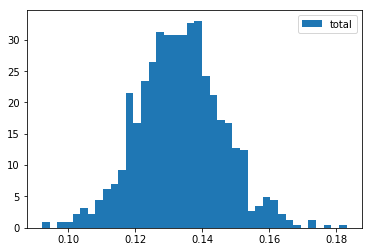

In [11]:
plot_bs_comp(Total_with_genre_count, ['net', 'genre_count'], stats.pearsonr, size=1000, bins=40, split=False)

The spread of net revenue per genre is shown in the boxplot below. The `Animation` genre appears to produce the most amount of hits at a consistent rate. The title of maximum net revenue, however, is held by `Science Fiction`, `Fantasy`, `Adventure`, and `Action` films.

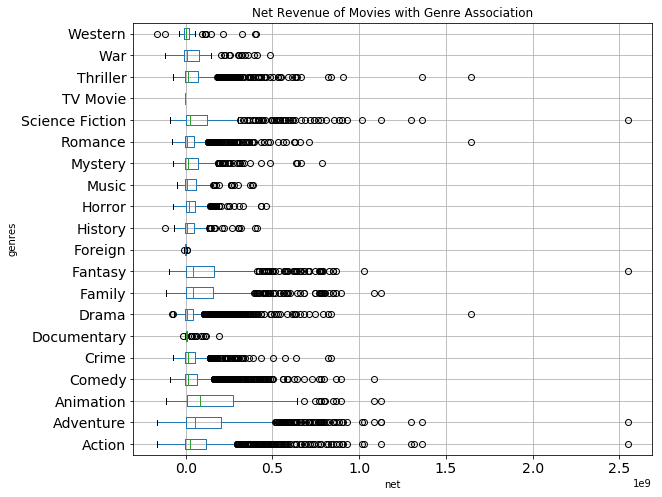

In [12]:
_ = Total_genres.boxplot(by="name", column='net', figsize=(9, 8), fontsize = 14, vert=False)
_ = plt.xlabel('net')
_ = plt.ylabel('genres')
_ = plt.suptitle("")
_ = plt.title('Net Revenue of Movies with Genre Association')

The histogram below shows us that `Comedy` and `Drama` films hold the lion's share of films made. Comparing the 95% confidence interval for net revenue for movies associated with both genres, we can see that a `Comedy` film is likely to be more profitable than a `Drama`.

In [13]:
get_plotly(dfs=[Total_genres[Total_genres.net >= 0], Total_genres[Total_genres.net < 0]], 
           x='name', 
           dfname=['Hits', 'Flops'], 
           xlabel='genres', plot_type='hist', title='most popular genres')

95% CI:  [ 32782954.31518792  40957879.64645575]


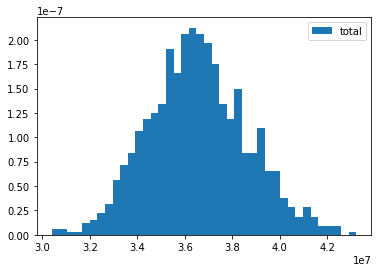

In [14]:
plot_bs_comp(Total_genres[Total_genres['name'] == 'Drama'], 'net', np.mean, size=1000, bins=40, split=False)

95% CI:  [ 47120843.27750778  57833238.50560748]


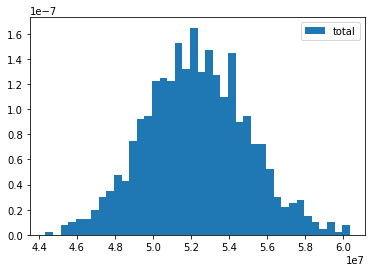

In [15]:
plot_bs_comp(Total_genres[Total_genres['name'] == 'Comedy'], 'net', np.mean, size=1000, bins=40, split=False)

# Runtime
Majority of movies have a runtime under 2 hours. We can see that for hits, they are in the upper end of the spectrum for runtime around 110 minutes. Flops, on the other hand, generally only run for 105 minutes. Overall, there is weak positive correlation between runtime and net revenue.

95% CI:  [ 108.00612807  109.19230549]


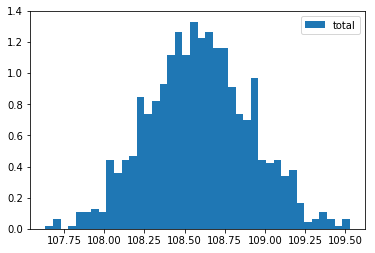

In [16]:
plot_bs_comp(movies, 'runtime', np.mean, size=1000, bins=40, split=False)

95% CI for hits:  [ 109.06945107  110.5214371 ]
95% CI for flops:  [ 105.01390449  107.07515801]


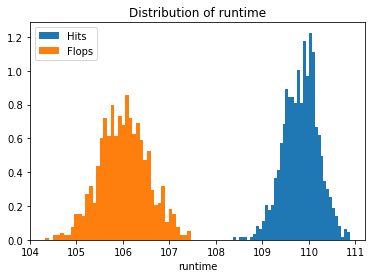

In [17]:
plot_bs_comp(movies, 'runtime', np.mean, size=1000, bins=40)

95% CI:  [ 0.17989395  0.25620836]


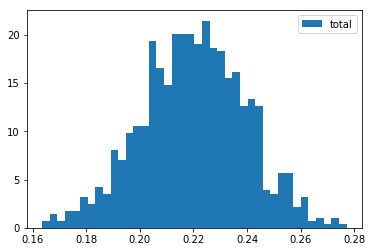

In [18]:
plot_bs_comp(movies, ['runtime','net'], stats.pearsonr, size=1000, bins=40, split=False)

# Actors
The actors attached to a film garner the most attention from the general public. A movie starring a well known celebrity such as Tom Cruise is sure to generate more buzz than someone who is relatively new and unknown. It is also harder to predict the performance of a film if the lead is cast to an actor with no history of hits to his/her credit. In the boxplot below, we can see that Tom Cruise may be the most consistently profitable actor.

In [19]:
movies_with_actors = movies.join(cast)
actors_df = movies_with_actors.reset_index()

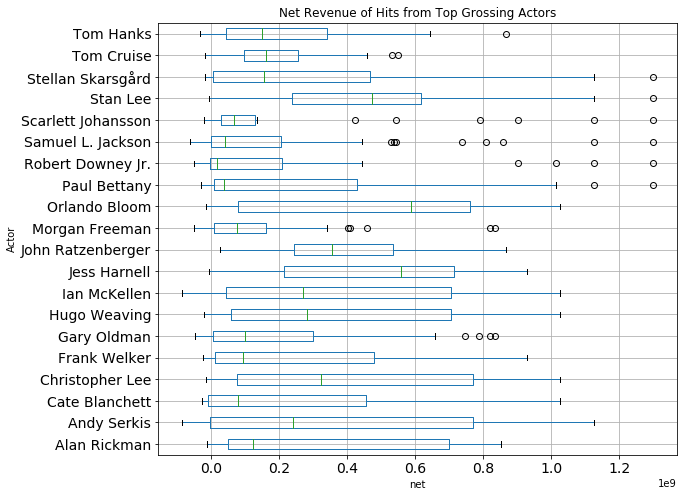

In [38]:
actors_with_hits = movies_with_actors[movies_with_actors.net > 0]
actors_with_hits = actors_with_hits.groupby('name')[['net', 'net_pct']].agg(
    ['count', 'max', 'min','sum', 'mean']).sort_values(('net','sum'),ascending=False)

sum_top_working_actors = list(actors_with_hits.head(20).index)

_ = actors_df[actors_df.name.isin(sum_top_working_actors)].boxplot(by="name", column='net', figsize=(9, 8), fontsize = 14, vert=False)
_ = plt.xlabel('net')
_ = plt.ylabel('Actor')
_ = plt.suptitle("")
_ = plt.title('Net Revenue of Hits from Top Grossing Actors')

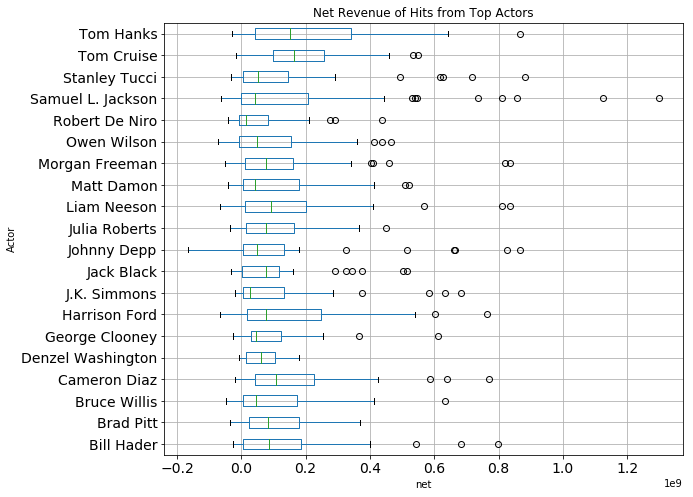

In [23]:
actors_with_hits = movies_with_actors[movies_with_actors.net > 0]
actors_with_hits = actors_with_hits.groupby('name')[['net', 'net_pct']].agg(
    ['count', 'max', 'min','sum', 'mean']).sort_values(('net','count'),ascending=False)

top_working_actors = list(actors_with_hits.head(20).index)

_ = actors_df[actors_df.name.isin(top_working_actors)].boxplot(by="name", column='net', figsize=(9, 8), fontsize = 14, vert=False)
_ = plt.xlabel('net')
_ = plt.ylabel('Actor')
_ = plt.suptitle("")
_ = plt.title('Net Revenue of Hits from Top Actors')

It is also surprising to see that some of the names associated with most amount of profitable movies also appear in the list of actors with the most amount of film flops (e.g., Samuel L Jackson and Robert DeNiro). For these actors, over the span of their entire career, they tend to bring a net positive. 

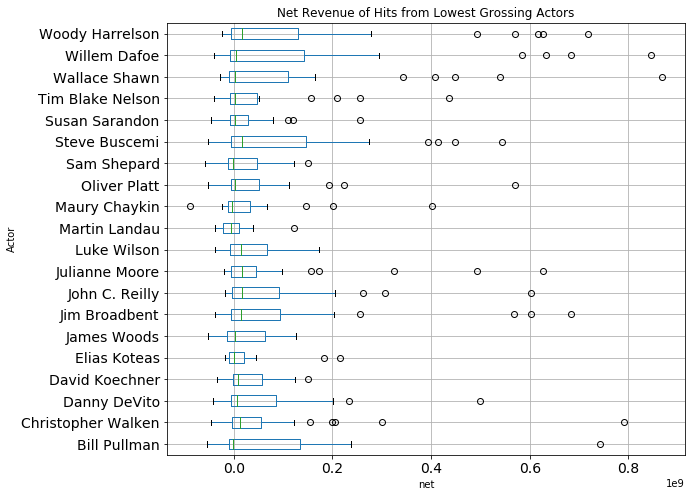

In [40]:
actors_with_flops = movies_with_actors[movies_with_actors.net < 0]
actors_with_flops = actors_with_flops.groupby('name')[['net', 'net_pct']].agg(
    ['count', 'max', 'min','sum', 'mean']).sort_values(('net','sum'),ascending=False)

exp_actors_with_flops = actors_with_flops[actors_with_flops['net','count']>10]
sum_worst_working_actors = list(exp_actors_with_flops.head(20).index)

new_actors_with_flops = actors_with_flops[actors_with_flops['net','count']>1]
new_worst_working_actors = list(new_actors_with_flops.head(20).index)

_ = actors_df[actors_df.name.isin(sum_worst_working_actors)].boxplot(by="name", column='net', figsize=(9, 8), fontsize = 14, vert=False)
_ = plt.xlabel('net')
_ = plt.ylabel('Actor')
_ = plt.suptitle("")
_ = plt.title('Net Revenue of Hits from Lowest Grossing Actors')


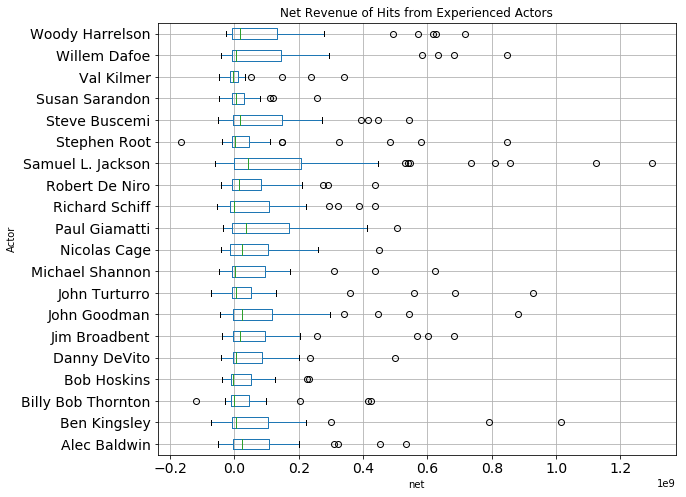

In [41]:
actors_with_flops = movies_with_actors[movies_with_actors.net < 0]
actors_with_flops = actors_with_flops.groupby('name')[['net', 'net_pct']].agg(
    ['count', 'max', 'min','sum', 'mean']).sort_values(('net','count'),ascending=False)

exp_actors_with_flops = actors_with_flops[actors_with_flops['net','count']>10]
worst_working_actors = list(exp_actors_with_flops.head(20).index)

new_actors_with_flops = actors_with_flops[actors_with_flops['net','count']>1]
new_worst_working_actors = list(new_actors_with_flops.head(20).index)

_ = actors_df[actors_df.name.isin(worst_working_actors)].boxplot(by="name", column='net', figsize=(9, 8), fontsize = 14, vert=False)
_ = plt.xlabel('net')
_ = plt.ylabel('Actor')
_ = plt.suptitle("")
_ = plt.title('Net Revenue of Hits from Experienced Actors')


It will be interesting to investigate the profitability actors over time. Nicolas Cage, for example, had a string of major hits in the late 1990s (e.g. The Rock, Con-Air), and because less consistent as time went on -- as well as participating in some major flops. He was attached to a huge hit in The Croods, but it was an animated film and it's difficult to attribute the movie's success to Nicolas Cage's involvement.

In [43]:
top_actor_history = actors_df[actors_df['name'].isin(sum_top_working_actors)]
worst_actor_history = actors_df[actors_df['name'].isin(sum_worst_working_actors)]

In [72]:
data = []
for actor in top_working_actors:
    actor_history = actors_df[actors_df['name'] == actor].sort_values(by='release_date')
    trace = go.Scatter(x=actor_history['release_date'],y=actor_history['net'],text=actor_history['title'], name=actor)
    data.append(trace)

layout=go.Layout(title="Time History of Top Grossing Actors")
fig = go.Figure(data=data,layout=layout)
iplot(fig)

In [73]:
data = []
for actor in exp_worst_working_actors:
    actor_history = actors_df[actors_df['name'] == actor].sort_values(by='release_date')
    trace = go.Scatter(x=actor_history['release_date'],y=actor_history['net'],text=actor_history['title'], name=actor)
    data.append(trace)

layout=go.Layout(title="Time History of Lowest Grossing Actors")
fig = go.Figure(data=data,layout=layout)
iplot(fig)

In [46]:
data = []
for actor in new_worst_working_actors:
    actor_history = actors_df[actors_df['name'] == actor].sort_values(by='release_date')
    trace = go.Scatter(x=actor_history['release_date'],y=actor_history['net'],text=actor_history['title'], name=actor)
    data.append(trace)

layout=go.Layout(yaxis=dict(zeroline=True))
iplot(data)

# Crew
Although actors may get the most press, they often do not have the most influence over the final product. Film is considered a director's medium, but a director can only do so much with a poor script. On the other hand, an average movie may be boosted with the help of a classic soudntrack. In other words, there are a lot of players involved. A boxplot of people involved in any role of the top grossing films show us that Stan Lee is responsible for a clear majority of successful films by a wide margin. It is no secret that Marvel movies have dominated the box office for several years now. It is also interesting to note that Steven Spielberg is may be the best director to maximize net revenue.

In [47]:
movies_with_crew = movies.join(crew)
crew_df = movies_with_crew.reset_index()

In [48]:
sorted_movies_with_crew = movies_with_crew.groupby('name')[['net', 'net_pct']].agg(
    ['count', 'max', 'min','sum', 'mean']).sort_values(('net','sum'),ascending=False)

In [49]:
crew_with_hits = movies_with_crew[movies_with_crew.net > 0]
crew_with_hits = crew_with_hits.groupby('name')[['net', 'net_pct']].agg(
    ['count', 'max', 'min','sum', 'mean']).sort_values(('net','sum'),ascending=False)
top_working_crew = list(crew_with_hits.head(20).index)

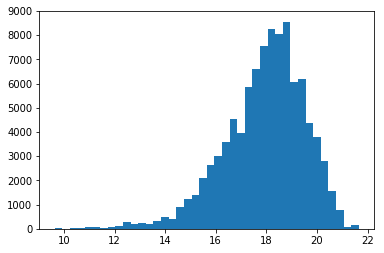

In [50]:
_ = plt.hist(np.log(movies_with_crew[movies_with_crew.net > 0].net), bins=40)

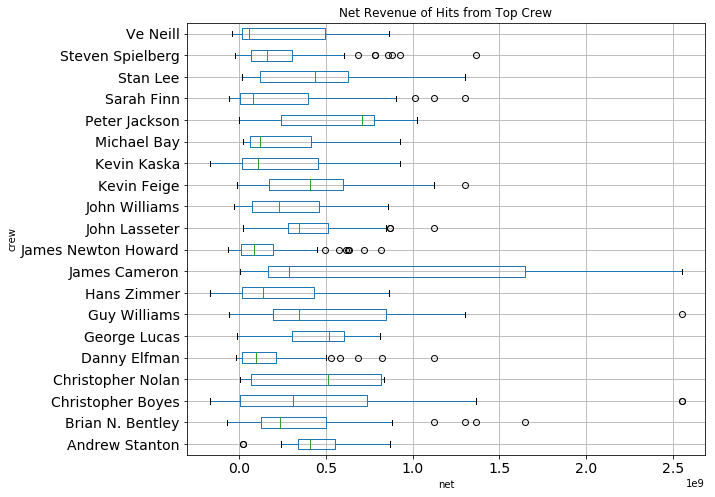

In [51]:
_ = crew_df[crew_df.name.isin(top_working_crew)].boxplot(by="name", column='net', figsize=(9, 8), fontsize = 14, vert=False)
_ = plt.xlabel('net')
_ = plt.ylabel('crew')
_ = plt.suptitle("")
_ = plt.title('Net Revenue of Hits from Top Crew')

Conversely, we can see that Renny Harlin and Spike Lee may not be the best director's to helm a profitable film.

In [52]:
crew_with_flops = movies_with_crew[movies_with_crew.net < 0]
crew_with_flops = crew_with_flops.groupby('name')[['net', 'net_pct']].agg(
    ['count', 'max', 'min','sum', 'mean']).sort_values(('net','sum'),ascending=False)

exp_worst_working_crew = crew_with_flops[crew_with_flops['net','count'] > 10]
exp_worst_working_crew = list(exp_worst_working_crew.head(20).index)

new_worst_working_crew = crew_with_flops[crew_with_flops['net','count'] > 1]
new_worst_working_crew = list(new_worst_working_crew.head(20).index)

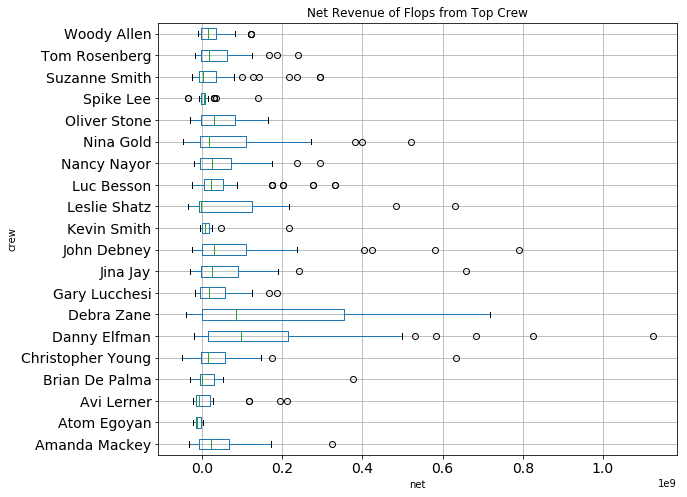

In [53]:
_ = crew_df[crew_df.name.isin(exp_worst_working_crew)].boxplot(by="name", column='net', figsize=(9, 8), fontsize = 14, vert=False)
_ = plt.xlabel('net')
_ = plt.ylabel('crew')
_ = plt.suptitle("")
_ = plt.title('Net Revenue of Flops from Top Crew')

In [54]:
data = []
for crew in top_working_crew:
    crew_history = crew_df[crew_df['name'] == crew].sort_values(by='release_date')
    trace = go.Scatter(x=crew_history['release_date'],y=crew_history['net'],text=crew_history['title'], name=crew)
    data.append(trace)

layout=go.Layout(yaxis=dict(zeroline=True))
iplot(data)

In [55]:
data = []
for crew in exp_worst_working_crew:
    crew_history = crew_df[crew_df['name'] == crew].sort_values(by='release_date')
    trace = go.Scatter(x=crew_history['release_date'],y=crew_history['net'],text=crew_history['title'], name=crew)
    data.append(trace)

layout=go.Layout(yaxis=dict(zeroline=True))
iplot(data)

95% CI for hits:  [ 36808084.87227242  39914564.95101433]
95% CI for flops:  [ 22550462.05663624  25324549.95022823]


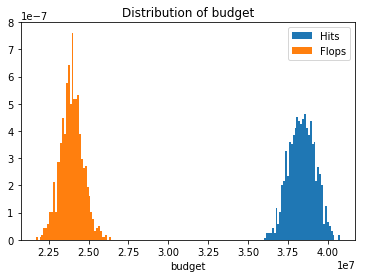

In [56]:
plot_bs_comp(Total, 'budget', np.mean, size=1000, bins=40, split=True)

95% CI:  [ 0.53183814  0.60361316]


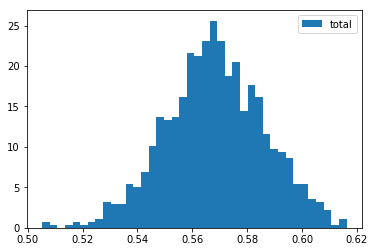

In [57]:
plot_bs_comp(Total, ['net', 'budget'], stats.pearsonr, size=1000, bins=40, split=False)

95% CI:  [-0.09744406 -0.07653952]


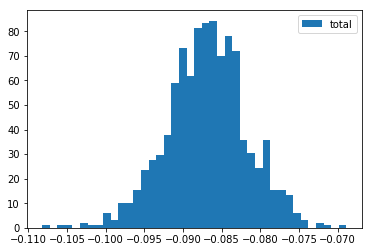

In [58]:
plot_bs_comp(Total, ['net_pct', 'budget'], stats.pearsonr, size=1000, bins=40, split=False)

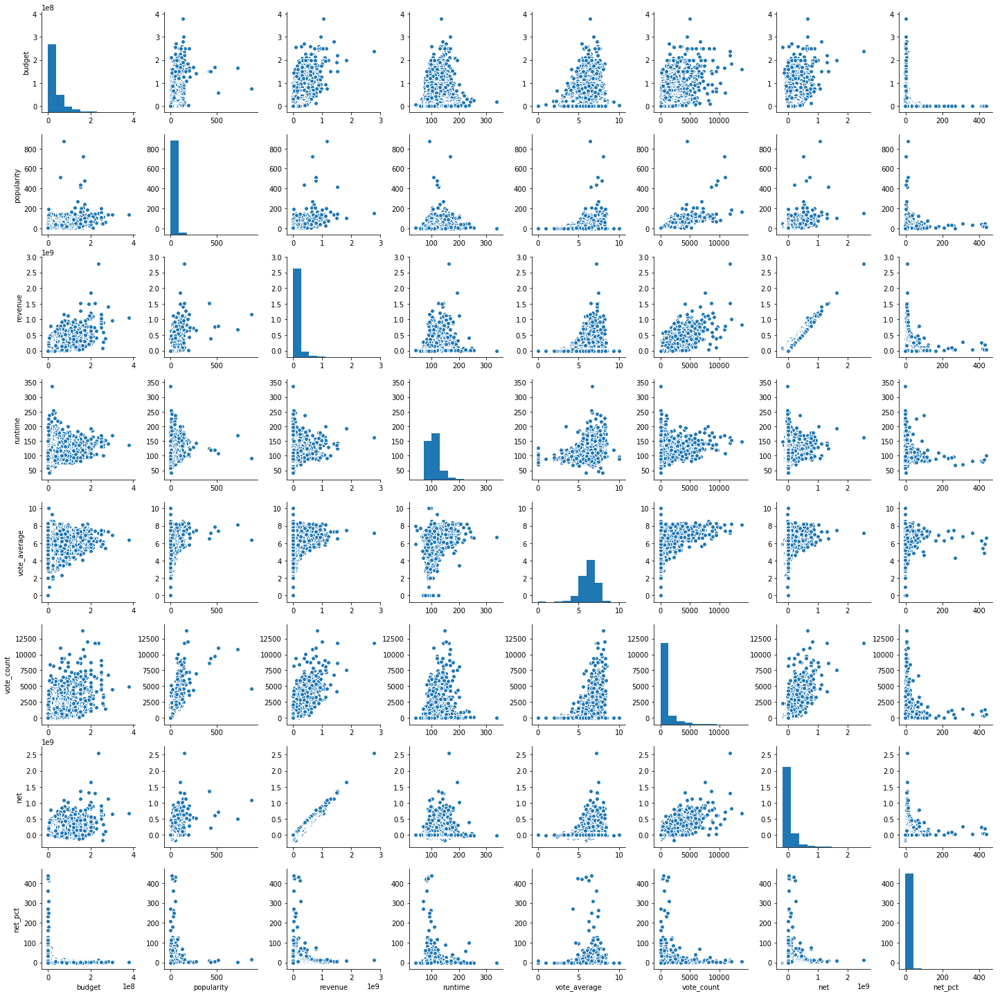

In [59]:
sns.pairplot(movies)

(array([  3.00000000e+00,   1.00000000e+00,   3.50000000e+01,
          1.13000000e+03,   2.03200000e+03,   9.53000000e+02,
          1.60000000e+02,   3.60000000e+01,   6.00000000e+00,
          1.00000000e+00]),
 array([ 3.71357207,  3.92451945,  4.13546683,  4.34641422,  4.5573616 ,
         4.76830898,  4.97925636,  5.19020375,  5.40115113,  5.61209851,
         5.8230459 ]),
 <a list of 10 Patch objects>)

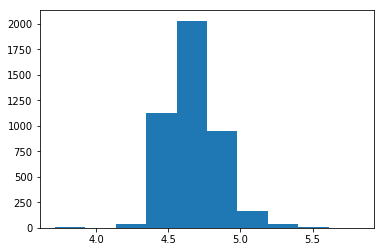

In [60]:
plt.hist(np.log(movies.runtime))

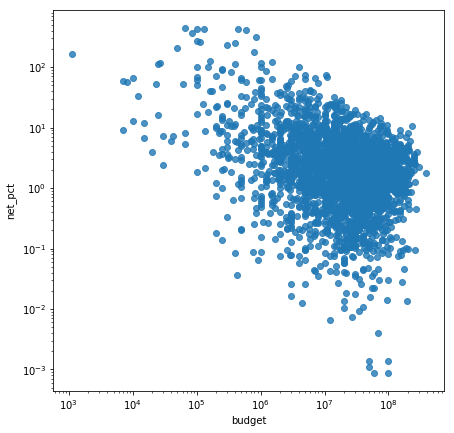

In [61]:
f, ax = plt.subplots(figsize=(7, 7))
ax.set(xscale='log',yscale="log")
sns.regplot("budget", "net_pct", movies, ax=ax, fit_reg=False)

In [62]:
by_year = movies.groupby(movies.release_date.dt.year).agg(['mean','count']).reset_index()

data = [{'x':by_year.release_date, 
        'y':np.log(by_year['budget','mean']), 
        'mode':'markers', 
        'text':by_year['budget','count'],
        'marker':dict(size=10),
        'name':""}]

layout = go.Layout(title="Rate of Increasing Budget Throughout the Years",
        xaxis=dict(title="Release Year"),
        yaxis=dict(title="Log(Budget)")
        )

fig = go.Figure(data=data, layout=layout)
iplot(fig)

In [63]:
by_year.describe()

release_date        budget             popularity              \
                            mean       count       mean       count   
count    89.000000  8.900000e+01   89.000000  89.000000   89.000000   
mean   1972.573034  1.458517e+07   48.955056  19.723566   48.955056   
std      26.553500  1.482406e+07   72.469102  13.515600   72.469102   
min    1916.000000  2.450000e+05    1.000000   0.579747    1.000000   
25%    1951.000000  2.494000e+06    3.000000  12.141883    3.000000   
50%    1973.000000  6.805511e+06    8.000000  18.426266    8.000000   
75%    1995.000000  2.981818e+07   51.000000  23.729549   51.000000   
max    2017.000000  5.520035e+07  220.000000  80.171283  220.000000   

            revenue                 runtime             vote_average  \
               mean       count        mean       count         mean   
count  8.900000e+01   89.000000   89.000000   89.000000    89.000000   
mean   5.936049e+07   48.955056  116.617839   48.955056     6.663836   
std    4.676548e+07   72.469102   17.858499   72.469102     0.559645   
min    3.531200e+04    1.000000   77.500000    1.000000     5.000000   
25%    1.633333e+07    3.000000  107.000000    3.000000     6.173077   
50%    5.933703e+07    8.000000  112.000000    8.000000     6.564286   
75%    9.277911e+07   51.000000  118.523810   51.000000     7.050000   
max    1.849255e+08  220.000000  197.000000  220.000000     8.000000   

                    vote_count                       net              \
            count         mean       count          mean       count   
count   89.000000    89.000000   89.000000  8.900000e+01   89.000000   
mean    48.955056   540.578081   48.955056  4.477532e+07   48.955056   
std     72.469102   414.748751   72.469102  3.802659e+07   72.469102   
min      1.000000     6.000000    1.000000 -1.964688e+06    1.000000   
25%      3.000000   176.200000    3.000000  1.221667e+07    3.000000   
50%      8.000000   533.454545    8.000000  4.258806e+07    8.000000   
75%     51.000000   696.259259   51.000000  6.317532e+07   51.000000   
max    220.000000  1914.000000  220.000000  1.834371e+08  220.000000   

          net_pct              
             mean       count  
count   89.000000   89.000000  
mean    12.574616   48.955056  
std     24.085039   72.469102  
min     -0.982344    1.000000  
25%      2.454343    3.000000  
50%      4.833333    8.000000  
75%     12.846154   51.000000  
max    160.813126  220.000000

In [64]:
data = [{'x':by_year.release_date, 
        'y':np.log(by_year[by_year['net','mean']>0]['net','mean']), 
        'mode':'markers', 
        'text':by_year['budget','count'],
        'marker':dict(size=10),
        'name':""}]

fig = go.Figure(data=data)
iplot(fig)

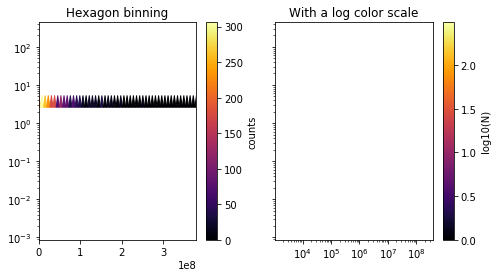

In [65]:
x = movies[movies.net_pct>0].budget
y = movies[movies.net_pct>0].net_pct
xmin = x.min()
xmax = x.max()
ymin = y.min()
ymax = y.max()

fig, axs = plt.subplots(ncols=2, sharey=True, figsize=(7, 4))
fig.subplots_adjust(hspace=0.5, left=0.07, right=0.93)
ax = axs[0]
hb = ax.hexbin(x, y, gridsize=50, cmap='inferno')
ax.axis([xmin, xmax, ymin, ymax])
ax.set_title("Hexagon binning")
cb = fig.colorbar(hb, ax=ax)
cb.set_label('counts')

ax = axs[1]
ax.set(xscale='log', yscale="log")
hb = ax.hexbin(x, y, gridsize=50, bins='log', cmap='inferno')
ax.axis([xmin, xmax, ymin, ymax])
ax.set_title("With a log color scale")
cb = fig.colorbar(hb, ax=ax)
cb.set_label('log10(N)')

plt.show()